<a href="https://colab.research.google.com/github/enidroman/data301_predictive_analytics_machine_learning/blob/main/Final_of_Enid_Roman_Data_301_Capstone_Project_Amazon_Alexa.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **QUESTIONS**

1. From 1 to 5 rating, which was the most highest score for Amazon Alexa?
2. Were there more postive reviews or negative reveiws?
3. Which variation had the most review?
4. Which word was used the most in the review?

###**DATA BACKGROUND**





Dataset consists of over 3000 Amazon customer reviews, star ratings (1 - 5), date of review, variant and feedback (1-Positive and 0-Negative) of various amazon Alexa products like Alexa Echo, Echo dots, etc.

Extracted from Amazon's website.

###**DATA ACQUISTION**

In [ ]:
# I Import the libraries needed.
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
# Import the dataset.
amazon_alexa = pd.read_csv ('https://raw.githubusercontent.com/niteen11/data301_predictive_analytics_machine_learning/main/data/amazon_alexa.tsv', sep='\t')

In [ ]:
# Checking the dataset
amazon_alexa.head()

,rating,date,variation,verified_reviews,feedback
0,5,31-Jul-18,Charcoal Fabric,Love my Echo!,1
1,5,31-Jul-18,Charcoal Fabric,Loved it!,1
2,4,31-Jul-18,Walnut Finish,"Sometimes while playing a game, you can answer...",1
3,5,31-Jul-18,Charcoal Fabric,I have had a lot of fun with this thing. My 4 ...,1
4,5,31-Jul-18,Charcoal Fabric,Music,1


In [ ]:
# Getting the shape of the dataset. How many rows and columns.
amazon_alexa.shape

(3150, 5)

In [ ]:
# Getting a summary of info of the dataset.
amazon_alexa.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3150 entries, 0 to 3149
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   rating            3150 non-null   int64 
 1   date              3150 non-null   object
 2   variation         3150 non-null   object
 3   verified_reviews  3150 non-null   object
 4   feedback          3150 non-null   int64 
dtypes: int64(2), object(3)
memory usage: 123.2+ KB


In [ ]:
# Checking if there is any null data or not.
amazon_alexa.isnull().sum()

rating              0
date                0
variation           0
verified_reviews    0
feedback            0
dtype: int64

In [ ]:
amazon_alexa.isna().any()

rating              False
date                False
variation           False
verified_reviews    False
feedback            False
dtype: bool

In [ ]:
# Checking the columns names.
amazon_alexa.columns

Index(['rating', 'date', 'variation', 'verified_reviews', 'feedback'], dtype='object')

In [ ]:
# Dropped column "date".
amazon_alexa = amazon_alexa.drop(columns=['date'])
amazon_alexa.head()

,rating,variation,verified_reviews,feedback
0,5,Charcoal Fabric,Love my Echo!,1
1,5,Charcoal Fabric,Loved it!,1
2,4,Walnut Finish,"Sometimes while playing a game, you can answer...",1
3,5,Charcoal Fabric,I have had a lot of fun with this thing. My 4 ...,1
4,5,Charcoal Fabric,Music,1


In [ ]:
#To remove emojis.
amazon_alexa.astype(str).apply(lambda x: x.str.encode('ascii', 'ignore').str.decode('ascii'))


,rating,variation,verified_reviews,feedback
0,5,Charcoal Fabric,Love my Echo!,1
1,5,Charcoal Fabric,Loved it!,1
2,4,Walnut Finish,"Sometimes while playing a game, you can answer...",1
3,5,Charcoal Fabric,I have had a lot of fun with this thing. My 4 ...,1
4,5,Charcoal Fabric,Music,1
5,5,Heather Gray Fabric,I received the echo as a gift. I needed anothe...,1
6,3,Sandstone Fabric,"Without having a cellphone, I cannot use many ...",1
7,5,Charcoal Fabric,I think this is the 5th one I've purchased. I'...,1
8,5,Heather Gray Fabric,looks great,1
9,5,Heather Gray Fabric,Love it! Ive listened to songs I havent heard ...,1


In [ ]:
# Getting the shape of the dataset after removing empyty rows. How many rows and columns.
amazon_alexa.shape

(3150, 4)

In [ ]:
# Describing the dataset.
amazon_alexa.describe()


,rating,feedback
count,3150.000000,3150.000000
mean,4.463175,0.918413
std,1.068506,0.273778
min,1.000000,0.000000
25%,4.000000,1.000000
50%,5.000000,1.000000
75%,5.000000,1.000000
max,5.000000,1.000000


In [ ]:
# Describing the data according to the ratings.
amazon_alexa.groupby('rating').describe()

feedback                                   
          count mean  std  min  25%  50%  75%  max
rating                                            
1         161.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0
2          96.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0
3         152.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0
4         455.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0
5        2286.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0

In [ ]:
# Describing the data according to the feedback.
amazon_alexa.groupby('feedback').describe()

rating                                             
           count      mean       std  min  25%  50%  75%  max
feedback                                                     
0          257.0  1.373541  0.484688  1.0  1.0  1.0  2.0  2.0
1         2893.0  4.737643  0.546544  3.0  5.0  5.0  5.0  5.0

In [ ]:
# Adding a length column for analyzing the length of the reviews.
amazon_alexa ['length'] = amazon_alexa['verified_reviews'].apply(len)

amazon_alexa.groupby('length').describe().sample(10)


rating                                 ... feedback                     
        count      mean       std  min   25%  ...      min   25%  50%  75%  max
length                                        ...                              
76       14.0  4.142857  1.292412  1.0  4.00  ...      0.0  1.00  1.0  1.0  1.0
173       4.0  5.000000  0.000000  5.0  5.00  ...      1.0  1.00  1.0  1.0  1.0
61       17.0  4.882353  0.332106  4.0  5.00  ...      1.0  1.00  1.0  1.0  1.0
622       1.0  5.000000       NaN  5.0  5.00  ...      1.0  1.00  1.0  1.0  1.0
193       6.0  4.500000  1.224745  2.0  5.00  ...      0.0  1.00  1.0  1.0  1.0
281       4.0  4.000000  1.414214  2.0  3.50  ...      0.0  0.75  1.0  1.0  1.0
129       4.0  5.000000  0.000000  5.0  5.00  ...      1.0  1.00  1.0  1.0  1.0
245       2.0  3.500000  0.707107  3.0  3.25  ...      1.0  1.00  1.0  1.0  1.0
220       4.0  2.750000  2.061553  1.0  1.00  ...      0.0  0.00  0.5  1.0  1.0
382       1.0  4.000000       NaN  4.0  4.00  ...      1.0  1.00  1.0  1.0  1.0

[10 rows x 16 columns]

###**(EDA) EXPLORATORY DATA ANALYSIS**

In [ ]:
# Analyze the rating.
amazon_alexa['rating'].value_counts()

5    2286
4     455
1     161
3     152
2      96
Name: rating, dtype: int64

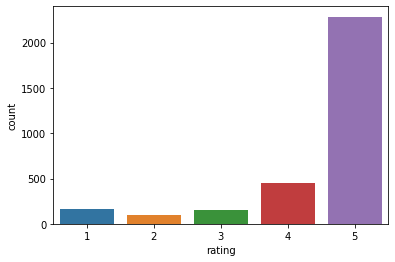

<Figure size 720x576 with 0 Axes>

In [ ]:
#Plotting rating.
sns.countplot(x ='rating', data = amazon_alexa)
plt.figure(figsize=(10,8))
plt.show()

Close to 3000 people had given 5 star rating for Alexa. Which means most customers are happy with Alexa. 

In [ ]:
# Analyze the feedback.
amazon_alexa['feedback'].value_counts()

1    2893
0     257
Name: feedback, dtype: int64

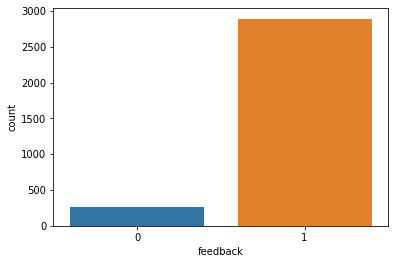

<Figure size 720x576 with 0 Axes>

In [ ]:
# Plotting positive and negative reviews.
sns.countplot(x ='feedback', data = amazon_alexa)
plt.figure(figsize=(10,8))
plt.show()

Overall Alexa has more positive reviews at close to 3000  then negative reviews at about 250. 

In [ ]:
# Analyze the variation.
amazon_alexa['variation'].value_counts()

Black  Dot                      516
Charcoal Fabric                 430
Configuration: Fire TV Stick    350
Black  Plus                     270
Black  Show                     265
Black                           261
Black  Spot                     241
White  Dot                      184
Heather Gray Fabric             157
White  Spot                     109
White                            91
Sandstone Fabric                 90
White  Show                      85
White  Plus                      78
Oak Finish                       14
Walnut Finish                     9
Name: variation, dtype: int64

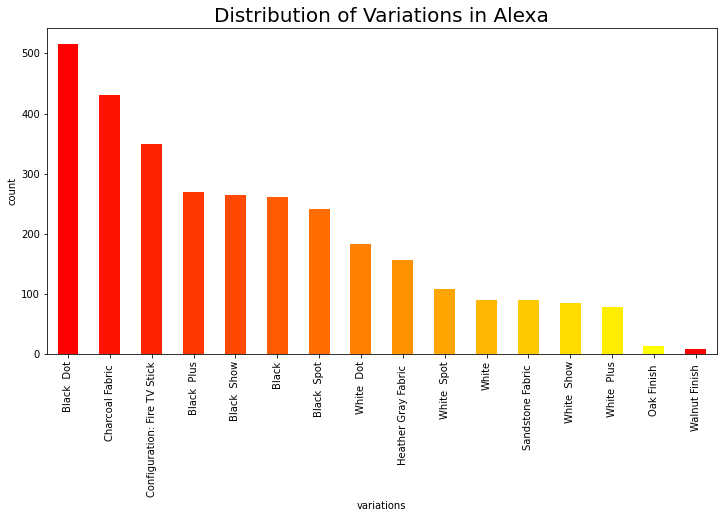

In [ ]:
# Plotting variation. 
color = plt.cm.autumn(np.linspace(0, 1, 15))
amazon_alexa['variation'].value_counts().plot.bar(color = color, figsize = (12, 6))
plt.title('Distribution of Variations in Alexa', fontsize = 20)
plt.xlabel('variations')
plt.ylabel('count')
plt.show()

This plot shows the different Variations of Amazon Alexa with their number of counts. Black Dot is the most popular variation of Amazon Alexa with more than 500 units out of 3150 samples.

In [ ]:
# Analysis of number of rating and feedback for each variation.
pd.set_option('display.max_rows', None)
amazon_alexa.groupby(['variation','rating']) ['feedback'].count()

variation                     rating
Black                         1          30
                              2           5
                              3          15
                              4          35
                              5         176
Black  Dot                    1          22
                              2          14
                              3          34
                              4          84
                              5         362
Black  Plus                   1          17
                              2          11
                              3          14
                              4          41
                              5         187
Black  Show                   1          10
                              2           8
                              3          14
                              4          43
                              5         190
Black  Spot                   1          18
                              2        

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15]),
 <a list of 16 Text major ticklabel objects>)

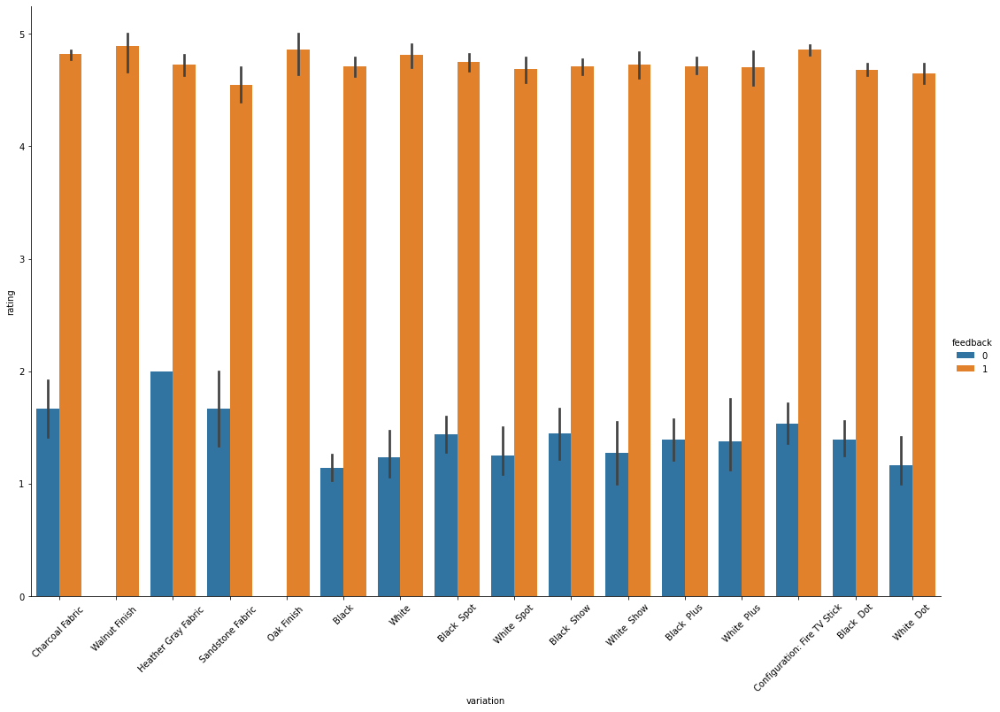

In [ ]:
# Plotting Feedback and Rating by each Variations.
sns.catplot(x="variation", y="rating", hue="feedback", kind="bar", data=amazon_alexa, height=10, aspect=12/8 )
plt.xticks(rotation=45)

Again this analysis shows Black Dot has the most 5 rating out of all the variations. 

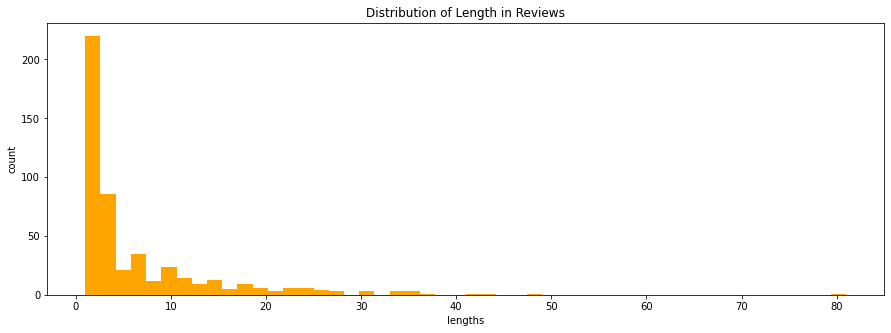

In [ ]:
# Plotting the lengths of the reviews written.
amazon_alexa['length'].value_counts().plot.hist(color = 'orange', figsize = (15, 5), bins = 50)
plt.title('Distribution of Length in Reviews')
plt.xlabel('lengths')
plt.ylabel('count')
plt.show()

This Distribution Plot, shows a distribution of Length of the Reviews written by the people. This shows on an average what is the length of the reviews written by the people for amazon alexa. Most of the Reviews are short only one or two words long. Very few people write long reviews. 

##**PREPARING DATASET FOR TEST AND TRAIN MODEL**

In [ ]:
# Let's drop the rating and length.
amazon_alexa = amazon_alexa.drop(['rating', 'length'],axis=1)

In [ ]:
variation_dummies = pd.get_dummies(amazon_alexa['variation'], drop_first = True)

In [ ]:
variation_dummies

,Black Dot,Black Plus,Black Show,Black Spot,Charcoal Fabric,Configuration: Fire TV Stick,Heather Gray Fabric,Oak Finish,Sandstone Fabric,Walnut Finish,White,White Dot,White Plus,White Show,White Spot
0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
3,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
7,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0


In [ ]:
# first let's drop the column
amazon_alexa.drop(['variation'], axis=1, inplace=True)

In [ ]:
# Now let's add the encoded column again
amazon_alexa = pd.concat([amazon_alexa, variation_dummies], axis=1)

In [ ]:
amazon_alexa

,verified_reviews,feedback,Black Dot,Black Plus,Black Show,Black Spot,Charcoal Fabric,Configuration: Fire TV Stick,Heather Gray Fabric,Oak Finish,Sandstone Fabric,Walnut Finish,White,White Dot,White Plus,White Show,White Spot
0,Love my Echo!,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
1,Loved it!,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
2,"Sometimes while playing a game, you can answer...",1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
3,I have had a lot of fun with this thing. My 4 ...,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
4,Music,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
5,I received the echo as a gift. I needed anothe...,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
6,"Without having a cellphone, I cannot use many ...",1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
7,I think this is the 5th one I've purchased. I'...,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
8,looks great,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
9,Love it! I’ve listened to songs I haven’t hear...,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0


In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

vectorizer = CountVectorizer()
alexa_countvectorizer = vectorizer.fit_transform(amazon_alexa['verified_reviews'])

In [ ]:
alexa_countvectorizer.shape

(3150, 4044)

In [ ]:
type(alexa_countvectorizer)

scipy.sparse.csr.csr_matrix

In [ ]:
print(vectorizer.get_feature_names())

['00', '000', '07', '10', '100', '100x', '11', '1100sf', '12', '129', '12am', '15', '150', '18', '19', '1964', '1990', '1gb', '1rst', '1st', '20', '200', '2000', '2017', '229', '23', '24', '25', '29', '2nd', '2package', '30', '300', '30pm', '34', '360', '39', '3rd', '3x', '3xs', '40', '45', '48', '4am', '4ghz', '4k', '4th', '50', '54', '5am', '5ghz', '5th', '600', '62', '672', '6th', '70', '75', '79', '80', '80s', '81', '83', '85', '88', '888', '8gb', '90', '91', '911', '99', '_specifically_', 'a1', 'a19', 'abay', 'abc', 'abd', 'abilities', 'ability', 'able', 'abode', 'about', 'above', 'absolutely', 'absolutly', 'ac', 'accent', 'acceptable', 'accepting', 'access', 'accessable', 'accessible', 'accessing', 'accessories', 'accesss', 'accident', 'accidentally', 'accompanying', 'accomplish', 'accomplished', 'according', 'accordingly', 'account', 'accounts', 'accuracy', 'accurate', 'accurately', 'accustom', 'acknowledge', 'acoustical', 'across', 'act', 'acting', 'action', 'actions', 'activat

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [ ]:
print(alexa_countvectorizer.toarray())  

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [ ]:
# first let's drop the column
amazon_alexa.drop(['verified_reviews'], axis=1, inplace=True)
reviews = pd.DataFrame(alexa_countvectorizer.toarray())

In [ ]:
# Now let's concatenate them together
amazon_alexa = pd.concat([amazon_alexa, reviews], axis=1)

In [ ]:
amazon_alexa

,feedback,Black Dot,Black Plus,Black Show,Black Spot,Charcoal Fabric,Configuration: Fire TV Stick,Heather Gray Fabric,Oak Finish,Sandstone Fabric,Walnut Finish,White,White Dot,White Plus,White Show,White Spot,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,...,4004,4005,4006,4007,4008,4009,4010,4011,4012,4013,4014,4015,4016,4017,4018,4019,4020,4021,4022,4023,4024,4025,4026,4027,4028,4029,4030,4031,4032,4033,4034,4035,4036,4037,4038,4039,4040,4041,4042,4043
0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
4,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
# Checked to make sure the features were numbered. 
amazon_alexa.head()

,feedback,Black Dot,Black Plus,Black Show,Black Spot,Charcoal Fabric,Configuration: Fire TV Stick,Heather Gray Fabric,Oak Finish,Sandstone Fabric,Walnut Finish,White,White Dot,White Plus,White Show,White Spot,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,...,4004,4005,4006,4007,4008,4009,4010,4011,4012,4013,4014,4015,4016,4017,4018,4019,4020,4021,4022,4023,4024,4025,4026,4027,4028,4029,4030,4031,4032,4033,4034,4035,4036,4037,4038,4039,4040,4041,4042,4043
0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
4,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
# I seperated the features attribute X value and the response label y value. I makes check the total columns and rows are correct. 
X = amazon_alexa.drop(['feedback'], axis=1)
X.head()

,Black Dot,Black Plus,Black Show,Black Spot,Charcoal Fabric,Configuration: Fire TV Stick,Heather Gray Fabric,Oak Finish,Sandstone Fabric,Walnut Finish,White,White Dot,White Plus,White Show,White Spot,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,...,4004,4005,4006,4007,4008,4009,4010,4011,4012,4013,4014,4015,4016,4017,4018,4019,4020,4021,4022,4023,4024,4025,4026,4027,4028,4029,4030,4031,4032,4033,4034,4035,4036,4037,4038,4039,4040,4041,4042,4043
0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
X.shape

(3150, 4059)

In [ ]:
y=amazon_alexa[['feedback']]
y.head()

,feedback
0,1
1,1
2,1
3,1
4,1


In [ ]:
y.shape

(3150, 1)

##**LOGISTIC REGRESSION**

I chose Logistic Regression as one of the models because is used as a method of binary classification.

In [ ]:
# I imported more libraries I need in order to perform the Logistic Regression. 
from sklearn.linear_model import LogisticRegression
logReg = LogisticRegression()
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn import metrics


In [ ]:
# Before implementing any classification algorithm, we will divide our dataset into training data and test data. I have used 75% of the data for training and the remaining 25% will be used for testing.
x_train, x_test, y_train, y_test = train_test_split(X,y, test_size=0.25)

In [ ]:
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(2362, 4059)
(788, 4059)
(2362, 1)
(788, 1)


In [ ]:
# I fit the model with data.
logReg.fit(x_train,y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:1679: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:985: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


LogisticRegression()

In [ ]:
# Perform prediction on the test set.
y_pred = logReg.predict(x_test)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:1679: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  FutureWarning,


In [ ]:
y_pred

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1,
       1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1,
       0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1,
       1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1,
       1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1,
       1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1,
       0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1,

In [ ]:
y_test.values[0:10]

array([[1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [0],
       [1],
       [1],
       [1]])

In [ ]:
y_pred[0:10]

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1])

In [ ]:
logReg.score(x_test,y_test)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:1679: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  FutureWarning,


0.9378172588832487

In [ ]:
accuracy_score(y_test,y_pred)

0.9378172588832487

The accuracy of logistic regression classifier using all features is 94%. Which means our model works with 94% accuracy.

In [ ]:
# I did a confusion matrix to describe the performance of a classification model. I also plot a sns heatmap. 
confusion_matrix(y_test,y_pred)

array([[ 33,  34],
       [ 15, 706]])

Text(0.5, 15.0, 'predicted value')

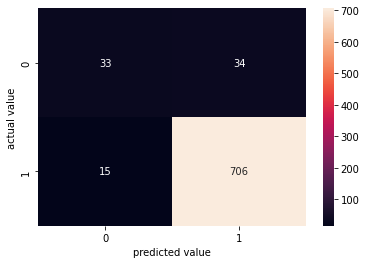

In [ ]:
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm,annot=True,fmt='0.0f')
plt.ylabel('actual value')
plt.xlabel('predicted value')

Shows Total Predictions 788, 33=True Negative (predicted 33 negative reviews). 15=False Negative Type 2 error (predicted 15 negative reviews), 34= False Positive Type 1 Error(predicted 34 false positive reviews). 706=True Positive (predicted 706 positive review).

Accuracy: .94

Misclassification Rate(Error Rate): .06

True Positive Rate(Sensitivity or Recall): .98

False Positive Rate: .51

True Negative Rate(Specifity): .49

This actually shows that 94% customers are satisfy with Amazon Alexa.

In [ ]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.69      0.49      0.57        67
           1       0.95      0.98      0.97       721

    accuracy                           0.94       788
   macro avg       0.82      0.74      0.77       788
weighted avg       0.93      0.94      0.93       788



1 = Positive,0 = Negative

Precision — What percent of your predictions were correct?

Recall — What percent of the positive cases did you catch?

F1 score — What percent of positive predictions were correct?

Support is the number of actual occurrences of the class in the specified dataset. 

Over all only 67 customers were not happy with Amazon Alexa but 721 were satisfy out of 788 reviews that were collected. 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:1679: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  FutureWarning,


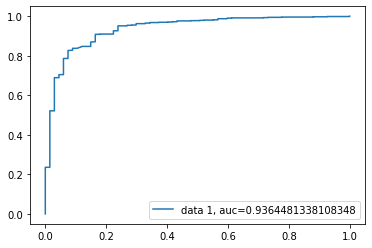

In [ ]:
# I did a ROC curve to plot of the true positive rate against the false positive rate. 
# This shows the tradeoff between sensitivity and specificity.
y_pred_proba = logReg.predict_proba(x_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)
auc = metrics.roc_auc_score(y_test, y_pred_proba)
plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.show()

AUC score is 94%.

In [ ]:
# I imported pyplot to get important features.
from matplotlib import pyplot
importance = logReg.coef_[0]
print(importance)

[ 0.55411122  0.3300829   0.212856   ... -0.10005642  0.02561571
  0.07479691]


Feature: 0, Score: 0.55411
Feature: 1, Score: 0.33008
Feature: 2, Score: 0.21286
Feature: 3, Score: -0.81145
Feature: 4, Score: 0.77171
Feature: 5, Score: 0.35536
Feature: 6, Score: 0.66758
Feature: 7, Score: 0.16879
Feature: 8, Score: 0.16101
Feature: 9, Score: 0.05781
Feature: 10, Score: -1.02696
Feature: 11, Score: -0.09368
Feature: 12, Score: 0.61966
Feature: 13, Score: -0.75708
Feature: 14, Score: -0.03554
Feature: 15, Score: 0.08725
Feature: 16, Score: -0.00158
Feature: 17, Score: -0.04051
Feature: 18, Score: 0.11003
Feature: 19, Score: -0.04867
Feature: 20, Score: 0.00000
Feature: 21, Score: 0.00720
Feature: 22, Score: 0.00110
Feature: 23, Score: -0.23830
Feature: 24, Score: 0.00000
Feature: 25, Score: 0.00504
Feature: 26, Score: 0.01304
Feature: 27, Score: 0.01282
Feature: 28, Score: -0.04051
Feature: 29, Score: 0.04811
Feature: 30, Score: 0.00000
Feature: 31, Score: 0.00650
Feature: 32, Score: 0.04261
Feature: 33, Score: 0.00000
Feature: 34, Score: 0.32689
Feature: 35, Score: 

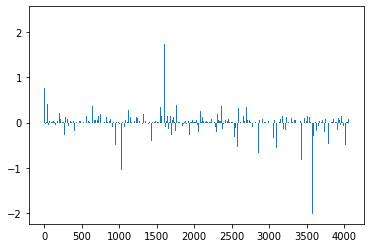

In [ ]:
for i,v in enumerate(importance):
  print('Feature: %0d, Score: %.5f' % (i,v))
# plot feature importance
pyplot.bar([x for x in range(len(importance))], importance)
pyplot.show()

In [ ]:
X.columns

Index([                  'Black  Dot',                  'Black  Plus',
                        'Black  Show',                  'Black  Spot',
                   'Charcoal Fabric ', 'Configuration: Fire TV Stick',
               'Heather Gray Fabric ',                  'Oak Finish ',
                  'Sandstone Fabric ',               'Walnut Finish ',
       ...
                                 4034,                           4035,
                                 4036,                           4037,
                                 4038,                           4039,
                                 4040,                           4041,
                                 4042,                           4043],
      dtype='object', length=4059)

##**DECISION TREE**

I chose Decision Tree as one of the other models because is used as a method of classification and could handle numerical and categorical data.

In [ ]:
# I imported Decision Tree Classifier. 
from sklearn.tree import DecisionTreeClassifier

In [ ]:
# I first did the Gini Model to compare it to the Entropy Model. 
dec_gini_model = DecisionTreeClassifier(criterion='gini',splitter='best',max_depth=2,min_samples_leaf=4)

In [ ]:
# I split and train the data set.  
dec_gini_model.fit(x_train,y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:1679: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  FutureWarning,


DecisionTreeClassifier(max_depth=2, min_samples_leaf=4)

In [ ]:
# Perform prediction on the test set.
y_pred = dec_gini_model.predict(x_test)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:1679: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  FutureWarning,


In [ ]:
y_pred

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

In [ ]:
dec_gini_model.score(x_test,y_test)*100

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:1679: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  FutureWarning,


91.49746192893402

In [ ]:
accuracy_score(y_test,y_pred)*100

91.49746192893402

The model and accuracy score was a perfect 91%.





In [ ]:
pip install pydotplus

In [ ]:
# Here I prepare for the tree graph. 
# pip install graphviz

In [ ]:
# I imported graphviz library. 
import pydotplus, graphviz
from sklearn import tree


In [ ]:
dot_img = tree.export_graphviz(dec_gini_model,out_file='test_img.dot',feature_names=x_train.columns,max_depth=3,class_names=['1','0'],filled=True,rounded=True)

In [ ]:
tree_graph = pydotplus.graph_from_dot_file('test_img.dot')

In [ ]:
# I imported Image library. 
from IPython.display import Image

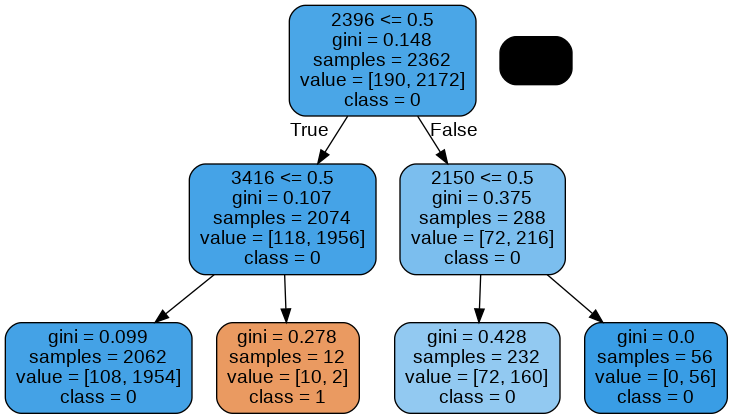

In [ ]:
Image(tree_graph.create_png())

The gini tree graph shows how many samples were used and how the data set was split. The gini index is .14. The value of 14% of the Gini Index shows 14% distribution of elements over some classes.

In [ ]:
dec_gini_model.feature_importances_

array([0., 0., 0., ..., 0., 0., 0.])

In [ ]:
dec_gini_feature_importance = pd.Series(dec_gini_model.feature_importances_,index=x_train.columns)

In [ ]:
dec_gini_feature_importance.sort_values(ascending=False)

2396                            0.447954
3416                            0.345652
2150                            0.206394
4043                            0.000000
1334                            0.000000
1335                            0.000000
1336                            0.000000
1337                            0.000000
1338                            0.000000
1339                            0.000000
1332                            0.000000
1340                            0.000000
1341                            0.000000
1342                            0.000000
1343                            0.000000
1344                            0.000000
1345                            0.000000
1333                            0.000000
1330                            0.000000
1331                            0.000000
1347                            0.000000
1329                            0.000000
1328                            0.000000
1327                            0.000000
1326            

Here it shows rating is also the most important feature. 

In [ ]:
# I did the entropy model to compare it to the gini model. 
dec_entropy_model = DecisionTreeClassifier(criterion='entropy',splitter='best',max_depth=2,min_samples_leaf=4)

In [ ]:
# I split and train the data set.  
dec_entropy_model.fit(x_train,y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:1679: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  FutureWarning,


DecisionTreeClassifier(criterion='entropy', max_depth=2, min_samples_leaf=4)

In [ ]:
# Perform prediction on the test set.
y_pred = dec_entropy_model.predict(x_test)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:1679: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  FutureWarning,


In [ ]:
y_pred

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

In [ ]:
dec_entropy_model.score(x_test,y_test)*100

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:1679: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  FutureWarning,


91.49746192893402

In [ ]:
accuracy_score(y_test,y_pred)*100

91.49746192893402

The model and accuracy score was a perfect 91%.

In [ ]:
dot_img = tree.export_graphviz(dec_entropy_model,out_file='test_img.dot',feature_names=x_train.columns,max_depth=3,class_names=['1','0'],filled=True,rounded=True)

In [ ]:
tree_graph = pydotplus.graph_from_dot_file('test_img.dot')

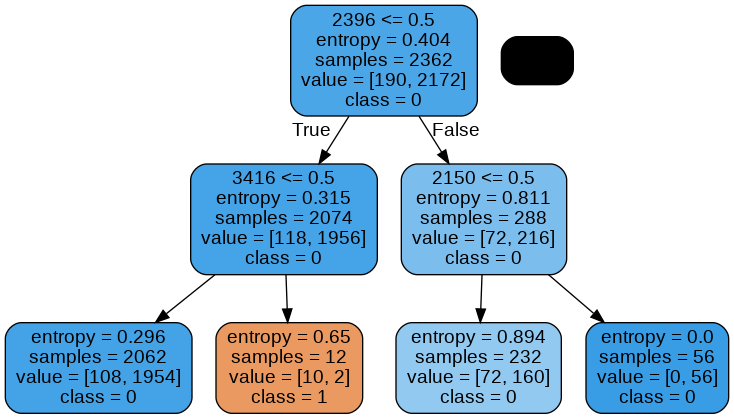

In [ ]:
Image(tree_graph.create_png())

The entropy tree graph shows how many samples were used and how the data set was split. The entropy index is .40. The value of 40% of the Entropy Index shows 40% distribution of elements over some classes.

Because of this I would chose entropy over gini. It has a higher distribution of the class. 

In [ ]:
dec_entropy_model.feature_importances_

array([0., 0., 0., ..., 0., 0., 0.])

In [ ]:
dec_entropy_feature_importance = pd.Series(dec_entropy_model.feature_importances_,index=x_train.columns)

In [ ]:
dec_entropy_feature_importance.sort_values(ascending=False)

2396                            0.523637
3416                            0.269466
2150                            0.206898
4043                            0.000000
1334                            0.000000
1335                            0.000000
1336                            0.000000
1337                            0.000000
1338                            0.000000
1339                            0.000000
1332                            0.000000
1340                            0.000000
1341                            0.000000
1342                            0.000000
1343                            0.000000
1344                            0.000000
1345                            0.000000
1333                            0.000000
1330                            0.000000
1331                            0.000000
1347                            0.000000
1329                            0.000000
1328                            0.000000
1327                            0.000000
1326            

Here it also shows rating is also the most important feature. 

##**NLP**

***Function to remove punctuation and stop word. ***

By removing these words, we remove the low-level information from our text in order to give more focus to the important information. Removal of stop words reduces the dataset size and thus reduces the training time due to the fewer number of tokens involved in the training.

In [ ]:
# I imported all the libraries I need to use.
import re
import string
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
from nltk.tokenize import word_tokenize
from collections import Counter

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
# Import the dataset again.
amazon_alexa = pd.read_csv ('https://raw.githubusercontent.com/niteen11/data301_predictive_analytics_machine_learning/main/data/amazon_alexa.tsv', sep='\t')

In [ ]:
amazon_alexa.columns

Index(['rating', 'date', 'variation', 'verified_reviews', 'feedback'], dtype='object')

In [ ]:
# I pulled up all the stopwords which does not add much meaning to a sentence. They can safely be ignored without sacrificing the meaning of the sentence. 
stopwords.words('english')[0:10]

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're"]

In [ ]:
# Prepared to remove stopwords and punctuation. 
def message_text_pre_process(text_message):
  remove_punct = [char for char in text_message if char not in string.punctuation]
  remove_punct = ''.join(remove_punct)
  remove_stopwords = [word for word in remove_punct.split() if word.lower() not in stopwords.words('english')]
  return remove_stopwords

**Process the Data.**

In [ ]:
# Prepared data. 
amazon_alexa['verified_reviews'].head(10).apply(message_text_pre_process)

0                                         [Love, Echo]
1                                              [Loved]
2    [Sometimes, playing, game, answer, question, c...
3    [lot, fun, thing, 4, yr, old, learns, dinosaur...
4                                              [Music]
5    [received, echo, gift, needed, another, Blueto...
6    [Without, cellphone, cannot, use, many, featur...
7    [think, 5th, one, Ive, purchased, Im, working,...
8                                       [looks, great]
9    [Love, I’ve, listened, songs, haven’t, heard, ...
Name: verified_reviews, dtype: object

In [ ]:
amazon_alexa.head()

,rating,date,variation,verified_reviews,feedback
0,5,31-Jul-18,Charcoal Fabric,Love my Echo!,1
1,5,31-Jul-18,Charcoal Fabric,Loved it!,1
2,4,31-Jul-18,Walnut Finish,"Sometimes while playing a game, you can answer...",1
3,5,31-Jul-18,Charcoal Fabric,I have had a lot of fun with this thing. My 4 ...,1
4,5,31-Jul-18,Charcoal Fabric,Music,1


**Vectorize** **to convert the text content to numerical feature vectors**

In [ ]:
# I imported all the CountVectorizer I need to use.
from sklearn.feature_extraction.text import CountVectorizer

In [ ]:
# Text data converted into numerical feature vectors with fixed size
bag_of_words = CountVectorizer(analyzer=message_text_pre_process).fit(amazon_alexa['verified_reviews'])

In [ ]:
bag_of_words_trf = bag_of_words.transform(amazon_alexa['verified_reviews'])

**TF-IDF** **to give a measure that takes the importance of a word into consideration depending on how frequently it occurs in a document and a corpus.**

In [ ]:
# I imported TfidfTransformer library.
from sklearn.feature_extraction.text import TfidfTransformer

In [ ]:
tfidf_fit = TfidfTransformer().fit(bag_of_words_trf)

In [ ]:
tfidf_trf = tfidf_fit.transform(bag_of_words_trf)

**Multinomial Naive Bayes**

I used Mutinomial Naive Bayes because it is the most basic technique for classification of text.


In [ ]:
# I imported all the MultinomiaNB library.
from sklearn.naive_bayes import MultinomialNB

In [ ]:
Labels_detector_model = MultinomialNB().fit(tfidf_trf,amazon_alexa['feedback'])

In [ ]:
test_message = amazon_alexa['verified_reviews'][10]

In [ ]:
test_message = 'I love amazon alexa spot dot.'

In [ ]:
bag_of_words_test_message = bag_of_words.transform([test_message])

In [ ]:
tfidf_test_messsge = tfidf_fit.transform(bag_of_words_test_message)

In [ ]:
Labels_detector_model.predict(tfidf_test_messsge)[0]

1

In [ ]:
amazon_alexa['feedback'][10]

1

In [ ]:
prediction_for_all_messages = Labels_detector_model.predict(tfidf_trf)

In [ ]:
# I imported the classification report.
from sklearn.metrics import classification_report

In [ ]:
print(classification_report(amazon_alexa['feedback'],prediction_for_all_messages))

              precision    recall  f1-score   support

           0       1.00      0.03      0.06       257
           1       0.92      1.00      0.96      2893

    accuracy                           0.92      3150
   macro avg       0.96      0.52      0.51      3150
weighted avg       0.93      0.92      0.89      3150



high recall + high precision : the class is perfectly handled by the model

low recall + high precision : the model can’t detect the class well but is highly trustable when it does



**Train Test Split**

In [ ]:
# I imported the train test split library.
from sklearn.model_selection import train_test_split

In [ ]:
# I did the train test split.
verified_reviews_train, verified_reviews_test, feedback_train, feedback_test = train_test_split(amazon_alexa['verified_reviews'],amazon_alexa['feedback']) 

In [ ]:
print(verified_reviews_train.shape)
print(verified_reviews_test.shape)
print(feedback_train.shape)
print(feedback_test.shape)

(2362,)
(788,)
(2362,)
(788,)


**Pipeline Building** 

To assemble several steps that can be cross-validated together while setting different parameters.

In [ ]:
# I imported the Pipeline. 
from sklearn.pipeline import Pipeline

In [ ]:
text_pipeline = Pipeline([
                          ('bag_of_words',CountVectorizer(analyzer=message_text_pre_process)),
                          ('tfidf',TfidfTransformer()),
                          ('classifier', MultinomialNB())
])

In [ ]:
text_pipeline.fit(verified_reviews_train,feedback_train)

Pipeline(steps=[('bag_of_words',
                 CountVectorizer(analyzer=<function message_text_pre_process at 0x7fc7e505e200>)),
                ('tfidf', TfidfTransformer()),
                ('classifier', MultinomialNB())])

In [ ]:
text_pred = text_pipeline.predict(verified_reviews_test)

In [ ]:
print(classification_report(text_pred,feedback_test))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       1.00      0.93      0.96       788

    accuracy                           0.93       788
   macro avg       0.50      0.46      0.48       788
weighted avg       1.00      0.93      0.96       788



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
verified_reviews_test.iloc[0]

'As Always, easy to set up'

In [ ]:
feedback_test.iloc[0]

1

In [ ]:
text_pred

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

In [ ]:
feedback_test.iloc[1]

1

In [ ]:
feedback_test

3005    1
820     1
1575    1
2930    1
1869    1
1880    1
1114    1
226     1
2623    1
491     0
195     1
2112    0
2110    1
3047    0
2491    0
44      1
1500    1
2003    1
1927    1
1498    1
2883    1
752     1
327     1
1758    1
1941    1
1618    1
1363    1
887     1
2776    1
230     1
84      1
857     0
2886    1
1753    1
2844    1
540     1
2997    1
2862    1
1298    1
41      1
2006    1
614     1
2810    1
892     1
761     1
383     1
435     1
2381    1
331     1
2371    1
800     1
1653    1
2223    1
940     1
68      1
592     1
2851    0
3038    1
229     1
2969    1
2458    1
227     1
1383    1
468     1
1454    1
375     1
2467    1
1124    1
93      1
1458    1
476     1
3143    1
1213    1
1178    1
2608    1
670     1
1900    1
1514    1
1977    1
2747    1
2782    1
1980    1
1934    1
428     1
1289    0
2066    1
1266    1
974     1
2784    1
138     1
1517    1
377     1
1130    1
642     1
191     1
2887    1
473     0
1207    1
933     1
2236    1


In [ ]:
!pip install --upgrade tensorflow
!pip install torch
!pip install transformers

In [ ]:
# I imported the pipeline from transformers. 
from transformers import pipeline

In [ ]:
sentiment_classififier = pipeline('sentiment-analysis', model='distilbert-base-uncased-finetuned-sst-2-english')

In [ ]:
sentiment_classififier('Black dot is terrible.')

[{'label': 'NEGATIVE', 'score': 0.999613344669342}]

In [ ]:
sentiment_classififier('''Love my alexa''')

[{'label': 'POSITIVE', 'score': 0.9998170733451843}]

Here I prepared the model to get the most frequent words used in the verified reviews. 

In [ ]:
STOPWORDS = set(stopwords.words('english'))
corpus=[]
for i in range(0,409):
    review = re.sub('[^a-zA-Z]', ' ', amazon_alexa['verified_reviews'][i])
    review = review.lower()
    review = review.split()
    stemmer = PorterStemmer()
    review = [stemmer.stem(token) for token in review if not token in STOPWORDS]
    #contain all words that are not in stopwords dictionary
    review=' '.join(review)
    corpus.append(review)
corpus

['love echo',
 'love',
 'sometim play game answer question correctli alexa say got wrong answer like abl turn light away home',
 'lot fun thing yr old learn dinosaur control light play game like categori nice sound play music well',
 'music',
 'receiv echo gift need anoth bluetooth someth play music easili access found smart speaker wait see els',
 'without cellphon cannot use mani featur ipad see use great alarm u r almost deaf hear alarm bedroom live room reason enough keep fun ask random question hear respons seem smartbon polit yet',
 'think th one purchas work get one everi room hous realli like featur offer specifili play music echo control light throughout hous',
 'look great',
 'love listen song heard sinc childhood get news weather inform great',
 'sent year old dad talk constantli',
 'love learn knew thing eveyday still figur everyth work far easi use understand make laugh time',
 'purchas mother knee problem give someth tri come get around fast like enjoy littl big thing ale

In [ ]:
# Most common words in the dataset
words = []
for i in range(0,len(corpus)):
    words = words + (re.findall(r'\w+', corpus[i]))
words

words_counts = Counter(words)
print(words_counts)
most_common_words = sorted(words_counts.items(), key=lambda x: x[1], reverse=True)
most_common_words

Counter({'echo': 132, 'love': 129, 'great': 106, 'music': 100, 'sound': 92, 'alexa': 89, 'use': 83, 'work': 78, 'like': 72, 'play': 58, 'speaker': 54, 'get': 44, 'good': 39, 'easi': 38, 'set': 38, 'qualiti': 38, 'one': 37, 'fun': 33, 'time': 32, 'learn': 31, 'still': 30, 'thing': 29, 'ask': 29, 'dot': 29, 'listen': 28, 'product': 28, 'purchas': 25, 'realli': 25, 'bought': 25, 'smart': 24, 'room': 24, 'home': 23, 'new': 23, 'light': 22, 'devic': 22, 'better': 21, 'prime': 20, 'would': 20, 'much': 20, 'amazon': 19, 'well': 18, 'look': 18, 'far': 18, 'day': 18, 'need': 17, 'go': 17, 'connect': 17, 'control': 16, 'featur': 16, 'amaz': 16, 'abl': 15, 'think': 15, 'hous': 15, 'enjoy': 15, 'want': 15, 'also': 15, 'say': 14, 'lot': 14, 'without': 14, 'everyth': 14, 'even': 14, 'got': 13, 'live': 13, 'gener': 13, 'buy': 13, 'nice': 12, 'song': 12, 'understand': 12, 'tri': 12, 'volum': 12, 'setup': 12, 'help': 12, 'could': 12, 'answer': 11, 'turn': 11, 'mani': 11, 'hear': 11, 'weather': 11, 'exp

[('echo', 132),
 ('love', 129),
 ('great', 106),
 ('music', 100),
 ('sound', 92),
 ('alexa', 89),
 ('use', 83),
 ('work', 78),
 ('like', 72),
 ('play', 58),
 ('speaker', 54),
 ('get', 44),
 ('good', 39),
 ('easi', 38),
 ('set', 38),
 ('qualiti', 38),
 ('one', 37),
 ('fun', 33),
 ('time', 32),
 ('learn', 31),
 ('still', 30),
 ('thing', 29),
 ('ask', 29),
 ('dot', 29),
 ('listen', 28),
 ('product', 28),
 ('purchas', 25),
 ('realli', 25),
 ('bought', 25),
 ('smart', 24),
 ('room', 24),
 ('home', 23),
 ('new', 23),
 ('light', 22),
 ('devic', 22),
 ('better', 21),
 ('prime', 20),
 ('would', 20),
 ('much', 20),
 ('amazon', 19),
 ('well', 18),
 ('look', 18),
 ('far', 18),
 ('day', 18),
 ('need', 17),
 ('go', 17),
 ('connect', 17),
 ('control', 16),
 ('featur', 16),
 ('amaz', 16),
 ('abl', 15),
 ('think', 15),
 ('hous', 15),
 ('enjoy', 15),
 ('want', 15),
 ('also', 15),
 ('say', 14),
 ('lot', 14),
 ('without', 14),
 ('everyth', 14),
 ('even', 14),
 ('got', 13),
 ('live', 13),
 ('gener', 13),
 

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


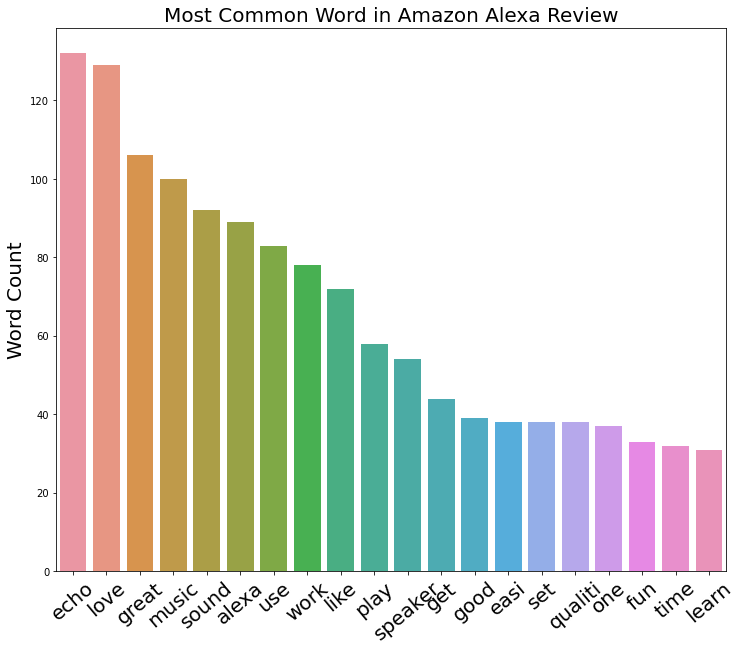

In [ ]:
most_commmom_wordList = []
most_commmom_CountList = []
for x, y in most_common_words:
    most_commmom_wordList.append(x)
    most_commmom_CountList.append(y)
    import seaborn as sns
plt.figure(figsize=(12,10))
plot = sns.barplot(np.arange(20), most_commmom_CountList[0:20])
plt.ylabel('Word Count',fontsize=20)
plt.xticks(np.arange(20), most_commmom_wordList[0:20], fontsize=20, rotation=40)
plt.title('Most Common Word in Amazon Alexa Review', fontsize=20)
plt.show()

Echo, followed by love was the most words found in the review. The least was learn, followed by time and then fun. 



##**CONCLUSION**

In [ ]:
from prettytable import PrettyTable    
x = PrettyTable()
x.field_names = ["Model","Precision", "Recall", "F1-score", "Support"]
x.add_row(["LogReg",.82,.74,.77,788])
x.add_row(["MNB",.96,.52,.51,3150])
x.add_row(["PipeBuild",.50,.46,.48,788])

print(x)

+-----------+-----------+--------+----------+---------+
|   Model   | Precision | Recall | F1-score | Support |
+-----------+-----------+--------+----------+---------+
|   LogReg  |    0.82   |  0.74  |   0.77   |   788   |
|    MNB    |    0.96   |  0.52  |   0.51   |   3150  |
| PipeBuild |    0.5    |  0.46  |   0.48   |   788   |
+-----------+-----------+--------+----------+---------+


In [ ]:
from prettytable import PrettyTable    
x = PrettyTable()
x.field_names = ["Model","Model Score", "Accuracy Score", "Index"]
x.add_row(["DecTrGini",.91,.91,0.15])
x.add_row(["DecTrEntr",.91,.91,0.40])
print(x)

+-----------+-------------+----------------+-------+
|   Model   | Model Score | Accuracy Score | Index |
+-----------+-------------+----------------+-------+
| DecTrGini |     0.91    |      0.91      |  0.15 |
| DecTrEntr |     0.91    |      0.91      |  0.4  |
+-----------+-------------+----------------+-------+


Evaluating the analysis of customer's feed back and rating, customers seem to be very happy with the Black Dot variation, followed by Charcoal Fabric. Amazon seem to be doing very well with the Amazon Alexa product because they have extremely more positive reviews on this product then negative reviews. 

I chose these models because I felt they were good for this type of dataset being that the dataset is based on reviews and the models can be used for binary classification.

In evaluating the above results that I got from each model, I prefer the Multinomial Naive Bayes Model because it perform the best at 96% accuracy. 

